# Home Assignment No. 2: Part 2 (Practice)
To solve this task, you will write a lot of code to try several deep learning methods.
* You are **HIGHLY RECOMMENDED** to read relevant documentation, e.g. for [python](https://docs.python.org/3/), [numpy](https://docs.scipy.org/doc/numpy/reference/), [matlpotlib](https://matplotlib.org/) and [pytorch](https://pytorch.org/). Also remember that seminars, lecture slides, [Google](http://google.com) and [StackOverflow](https://stackoverflow.com/) are your close friends during this course (and, probably, whole life?).

* To do this part of homework, you have to write **CODE** directly inside specified places inside notebook **CELLS**.

* In some problems you may be asked to provide short discussion of the results. In this cases you have to create **MARKDOWN** cell with your comments right after the your code cell.

* For every separate (sub)problem you can get only 0 points or maximal points for this (sub)problem. There are **NO INTERMEDIATE scores**. So make sure that you did everything required in the task

* Your **SOLUTION** notebook **MUST BE REPRODUCIBLE**, i.e. if the reviewer decides to execute `Kernel` -> `Restart Kernel and Run All Cells`, after all the computation he will obtain exactly the same solution (with all the corresponding plots) as in your uploaded notebook. For this purpose, we suggest to fix random `seed` or (better) define `random_state=` inside every algorithm that uses some pseudorandomness.

* Your code must be clear to the reviewer. For this purpose, try to include neccessary comments inside the code. But remember: **GOOD CODE MUST BE SELF-EXPLANATORY** without any additional comments.

## Task 1. Deep ANNs. (5 points)

### Task 1.1.  Activation functions. (1 point)
Plot the following [activation functions](https://pytorch.org/docs/master/nn.html#non-linear-activation-functions) using their PyTorch realizations and their derivatives using [autograd](https://pytorch.org/docs/stable/autograd.html) functionality `grad()`:
   
1. **(1 pt.)** Plot `ReLU`, `ELU` ($\alpha = 1$), `Softplus` ($\beta = 1$) and `Sign`, `Sigmoid`, `Softsign`, `Tanh`.
Which of these functions may be, and which - definitely, are a poor choise as an activation function in a neural network? Why?

In [1]:
%matplotlib inline
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch

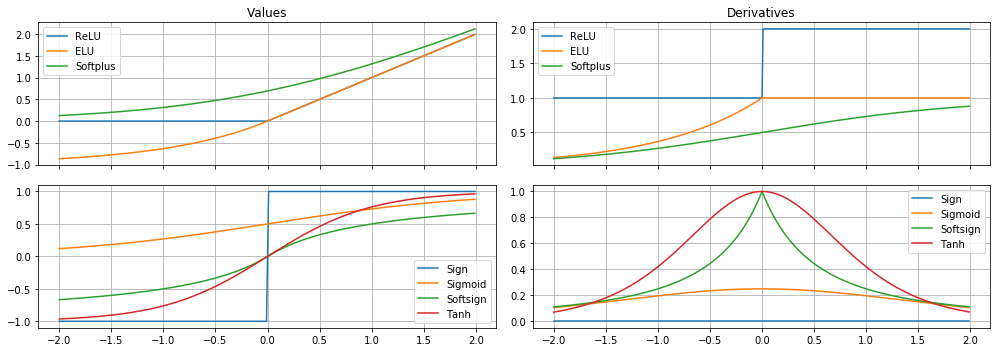

In [2]:
%matplotlib inline
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch

x = torch.arange(-2, 2, .01, requires_grad=True)
x_np = x.detach().numpy()
x.sum().backward() # to create x.grad

f, axes = plt.subplots(2, 2, sharex=True, figsize=(14, 5))
axes[0][0].set_title('Values')
axes[0][1].set_title('Derivatives')

for i, function_set in (0, (('ReLU', F.relu), ('ELU', F.elu), ('Softplus', F.softplus))), \
                       (1, (('Sign', torch.sign), ('Sigmoid', torch.sigmoid), ('Softsign', F.softsign), ('Tanh', torch.tanh))):
    for function_name, activation in function_set:
        
        act_value = activation(x).detach().numpy()
        axes[i][0].plot(x_np, act_value, label=function_name)
        activation(x).sum().backward()
        
        axes[i][1].plot(x_np, x.grad, label=function_name)
        x.grad.zero_()
    
    axes[i][0].grid()
    axes[i][1].grid()
    axes[i][0].legend()
    axes[i][1].legend()

plt.tight_layout()
plt.show()

Activation function should be non-linear.

Sigmoid output is not zero-centered, it suffers from vanishing gradients problem (when gradients can exponentialy decrease when propagating for several network layers), it is not the best function to be used as activation.

Slighlty better is tanh, it has zero-centered output, but still suffers from vanishing gradients.

There goes ReLU. It is non-linear, achieves better convergence than tanh, does not suffer from vanishing gradients, but due to its hard nature (zeroing for bound), it can result in dead neurons. This problem is solved by application of so-called LeakyReLu.

### Task 1.2. MNIST classification. (4 points)

At the **[Seminar 13](https://github.com/adasegroup/ML2020_seminars/tree/master/seminar12)** on neural networks, we designed an MLP (Multilayer perceptron) with one hidden layer using our numpy implementations of linear layer, logistic and softmax activation functions. In this task, you are to

1. **(1 pt.)** Implement the MLP modules, including the Softmax cross entropy between `logits` and `labels`.
2. **(2 pt.)** Train our numpy realization of MLP to classify the MNIST from `sklearn.datasets()`. The required accuracy on validation is `> 90%`.
3. **(1 pt.)** Compare the acccuracy of classification to your scores from `Part 1` with and without dimensionality reduction. Is this comparison fair? :) Derive the confusion matrix for all digits classes. Which digits are predicted better or worse than others?

In [3]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.datasets import load_digits
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [4]:
# fetch the dataset.
digits, targets = load_digits(return_X_y=True)
digits = digits.astype(np.float32) / 255

digits_train, digits_test, targets_train, targets_test = train_test_split(digits, targets, random_state=0)

train_size = digits_train.shape[0]

input_size = 8*8
classes_n = 10

**Implement the MLP with backprop.**

In [5]:
class Linear:
    def __init__(self, input_units, output_units, learning_rate=0.1):
        self.learning_rate = learning_rate
        
        self.weights = np.random.randn(input_units, output_units)
        self.biases = np.zeros(output_units)
        
    def forward(self, x):
        return x @ self.weights + self.biases
    
    def backward(self, x, grad_output):
        grad_input = grad_output @ self.weights.T
        
        grad_weights = x.T @ grad_output
        grad_biases = np.sum(grad_output, axis=0)

        self.weights = self.weights - self.learning_rate * grad_weights
        self.biases = self.biases - self.learning_rate * grad_biases
        
        return grad_input

In [6]:
# #Here you should implement by yourself MLP class and its constituents including forward and backward propagation methods

# class Linear:
#     def __init__(self, input_size, output_size):
#         # Trainable parameters of the layer and their gradients
#         self.thetas = np.random.randn(input_size, output_size) # the weight matrix of the layer (W)
#         self.thetas_grads = np.empty_like(self.thetas) # gradient w.r.t. the weight matrix of the layer
#         self.bias = np.random.randn(output_size) # bias terms of the layer (b)
#         self.bias_grads = np.empty_like(self.bias) # gradient w.r.t. bias terms of the linear layer

#     def forward(self, x):
#         output = np.matmul(x, self.thetas) + self.bias
#         return output

#     def backward(self, x, output_grad):
#         """
#         Calculate and return gradient of the loss w.r.t. the input of linear layer given the input x and the gradient
#         w.r.t output of linear layer. You should also calculate and update gradients of layer parameters.
#         :param x: np.array, input tensor for linear layer;
#         :param output_grad: np.array, grad tensor w.r.t output of linear layer;
#         :return: np.array, grad w.r.t input of linear layer
#         """

#         ### BEGIN Solution
#         # ... calculate grads
#         # >>> your solution here <<<

#         ### END Solution
#         return input_grad


class LogisticActivation:
    def __init__(self):
        # the layer has no parameters
        pass

    def forward(self, x):
        output = 1 / (1 + np.exp(-x))
        return output

    def backward(self, x, output_grad):
        """
        Calculate and return the gradient of the loss w.r.t. the input
        of logistic non-linearity (given input x and the gradient 
        w.r.t output of logistic non-linearity).

        :param x: np.array, input tensor for logistic non-linearity;
        :param output_grad: np.array, grad tensor w.r.t output of logistic non-linearity;
        :return: np.array, grad w.r.t input of logistic non-linearity

        """
        logact = self.forward(x)
        logact_grad = logact * (1 - logact)
        return logact_grad * output_grad


class MLP:
    def __init__(self, input_size, hidden_layer_size, output_size, learning_rate):
        self.linear1 = Linear(input_size, hidden_layer_size, learning_rate)
        self.activation1 = LogisticActivation()
        self.linear2 = Linear(hidden_layer_size, output_size, learning_rate)
        self.layers = [self.linear1, self.activation1, self.linear2]
        
    def forward(self, x):
        return self.linear2.forward(self.activation1.forward(self.linear1.forward(x)))

    def backward(self, x, output_grad):
        """
        Calculate and return the gradient of the loss w.r.t. the input of MLP given the input and the gradient 
        w.r.t output of MLP. You should also update gradients of paramerters of MLP layers.
        Hint - you should chain backward operations of modules you have already implemented. You may also
        need to calculate intermediate forward results.

        :param x: np.array, input tensor for MLP;
        :param output_grad: np.array, grad tensor w.r.t output of MLP;
        :return: np.array, grad w.r.t input of MLP
        """
        
        activations = [x]
        for layer in self.layers:
            activations.append(layer.forward(x))
            x = activations[-1]
        
        layer_grad = output_grad
        for i, layer in enumerate(self.layers[::-1]):
            layer_in = activations[-(i + 2)]
            layer_grad = layer.backward(layer_in, layer_grad)
        
        return layer_grad

In [7]:
def softmax_crossentropy_with_logits(logits, reference_answers):
    answers = logits[np.arange(logits.shape[0]), reference_answers]
    return np.log(np.exp(logits).sum(-1)) - answers

def grad_softmax_crossentropy_with_logits(logits, reference_answers):
    answers = np.zeros_like(logits)
    answers[np.arange(logits.shape[0]), reference_answers] = 1
    softmax = np.exp(logits) / np.exp(logits).sum(-1)
    
    return (softmax - answers) / logits.shape[0]

In [8]:
np.random.seed(42)

lr = 0.01

mlp = MLP(input_size=input_size,
          hidden_layer_size=100,
          output_size=classes_n,
          learning_rate=lr)

epochs_n = 100
learning_curve = [0] * epochs_n
test_curve = [0] * epochs_n

x_train = digits_train
x_test = digits_test
y_train = targets_train
y_test = targets_test


for epoch in range(epochs_n):

    train_loss = []
    for sample_i in range(train_size):
        x = x_train[sample_i].reshape((1, -1))
        target = np.array([y_train[sample_i]])

        logits = mlp.forward(x)

        loss = softmax_crossentropy_with_logits(logits, target)
        loss_grad = grad_softmax_crossentropy_with_logits(logits, target)

        train_loss.append(loss)
        mlp.backward(x, loss_grad)

    learning_curve[epoch] = np.mean(train_loss)

    logits_test = mlp.forward(x_test)
    loss_test = softmax_crossentropy_with_logits(logits_test, y_test)
    test_curve[epoch] = np.mean(loss_test)

    if epoch % 10 == 0:
        acc = accuracy_score(y_test, logits_test.argmax(axis=-1))
        print('Starting epoch {}'.format(epoch), ', Accuracy on test: ', acc)

Starting epoch 0 , Accuracy on test:  0.1622222222222222
Starting epoch 10 , Accuracy on test:  0.7622222222222222
Starting epoch 20 , Accuracy on test:  0.8644444444444445
Starting epoch 30 , Accuracy on test:  0.9
Starting epoch 40 , Accuracy on test:  0.9088888888888889
Starting epoch 50 , Accuracy on test:  0.92
Starting epoch 60 , Accuracy on test:  0.9222222222222223
Starting epoch 70 , Accuracy on test:  0.9266666666666666
Starting epoch 80 , Accuracy on test:  0.9288888888888889
Starting epoch 90 , Accuracy on test:  0.9311111111111111


/home/sanityseeker/.local/lib/python3.7/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


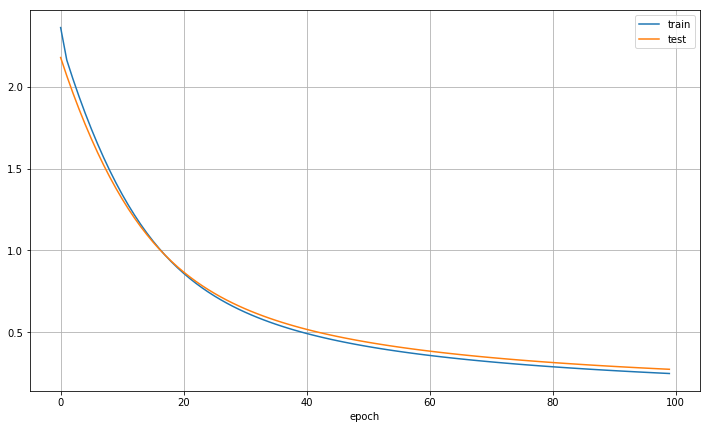

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(12, 7))

ax.plot(np.arange(epochs_n), learning_curve, label='train')
ax.plot(np.arange(epochs_n), test_curve, label='test')
ax.set_xlabel('epoch')
ax.legend()
ax.grid()

fig.show()

In [10]:
# confusion matrix
preds = mlp.forward(x_test).argmax(-1)
confusion_matrix(y_test, preds)

array([[37,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0,  1,  1,  0,  0,  1],
       [ 0,  1, 40,  1,  0,  0,  0,  2,  0,  0],
       [ 0,  0,  0, 43,  0,  0,  0,  1,  1,  0],
       [ 0,  0,  0,  0, 36,  0,  0,  2,  0,  0],
       [ 0,  0,  0,  1,  0, 46,  0,  0,  0,  1],
       [ 0,  1,  0,  0,  0,  0, 51,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 48,  0,  0],
       [ 0,  4,  1,  1,  0,  1,  0,  1, 39,  1],
       [ 0,  0,  0,  4,  0,  2,  0,  0,  0, 41]])

Most common difficulties in classification occurs in the following pairs: 9 vs 3, 7 vs 2, and 9 vs 5

The accuracy of such classification with simple neural net is comparable to knn classifier with dimentionality reduction and is worse than logreg + features from manifold methods. However, more complex neural networks can achieve significantly better results, because, unlike mlp, they will also utilize spatial information, which is very important when working with images. NNs can achieve more complex latent representations than methods dependent on spatial representations.   

## Task 2. Autoencoders. (7 points)

### Task 2.1.  Autoencoder on the tabular data. (3 points)


We will build a latent representation for tabular data with simple Autoencoder (AE). We are going to work with the cancer dataset from scikit-learn package. You are to follow the instructions `1.0 - 1.6`.  

1. **(1 pt.)** Implement AE modules;
2. **(2 pt.)** Train AE to get latent representation of the cancer dataset from `sklearn.datasets()`. Use `MSE` loss and get < $0.28$ on validation, with AE "bottleneck" = $2$;
3. **(1 pt.)** Plot the latent representation of whole dataset in 2D, use colors to show object of differneet classes;

In [11]:
# imports
import sklearn.datasets as sk_data
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.utils.data as torch_data

#### 1.0 Featch the data. Scale it and split on train and test.

In [12]:
cancer_dset = sk_data.load_breast_cancer()

X = StandardScaler().fit_transform(cancer_dset['data'])

print('Features: ', list(cancer_dset['feature_names']))
print('\nShape:', X.shape)

X_train, X_val, y_train, y_val = train_test_split(
    X, cancer_dset['target'], test_size=0.2, random_state=42)
print('\nTrain size: ', len(X_train))
print('Validation size: ', len(X_val))

Features:  ['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness', 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension']

Shape: (569, 30)

Train size:  455
Validation size:  114


#### 1.1 Let us firtly create the dataset, which we'll be able to use with pytorch dataloader. 
Implement `__len__` and `__getitem__` methods.

In [13]:
class CancerData(torch_data.Dataset):
    def __init__(self, X, y):
        super(CancerData, self).__init__()
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32)

    def __len__(self):
        return self.X.size()[0]

    def __getitem__(self, idx):
        return self.X[idx].unsqueeze(0), self.y[idx]

In [14]:
train_dset = CancerData(X_train, y_train) 
val_dset = CancerData(X_val, y_val) 

print(train_dset[5])

(tensor([[ 0.1172,  1.9199,  0.1961,  0.0111,  1.2482,  1.0453,  0.9429,  0.6376,
          1.7940,  1.1302, -0.1269, -0.3336,  0.0064, -0.1713, -0.4780,  0.9458,
          0.5145, -0.1454, -0.2388,  0.6321,  0.2466,  1.8650,  0.5016,  0.1101,
          1.5532,  2.5664,  2.0649,  0.8617,  2.1310,  2.7793]]), tensor(0.))


#### 1.2 Now, we'll make a base class for our autoencoder. 
AE takes as input encoder and decoder (it will be two neural networks). Your task is to implement the forward pass.

In [15]:
class MyFirstAE(nn.Module):
    def __init__(self, encoder, decoder):
        super(MyFirstAE, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        """
        Take a mini-batch as an input, encode it to the latent space and decode back to the original space
        x_out = decoder(encoder(x))
        :param x: torch.tensor, (MB, x_dim)
        :return: torch.tensor, (MB, x_dim)
        """
        return self.decoder(self.encoder(x))

#### 1.3 It is high time to create encoder an decoder neural networks!
Make hidden size of the network to be equal to `2`.

**Hint.** You can use `nn.Sequential` to create your own archtectures.

In [16]:
dim = train_dset[0][0].size()[1]
large_dim = 200

encoder = lambda hidden_size: nn.Sequential(
    nn.Linear(dim, large_dim),
    nn.LeakyReLU(inplace=True),
    nn.Dropout(0.1),
    nn.Linear(large_dim, hidden_size),
)

decoder = lambda hidden_size: nn.Sequential(
    nn.Linear(hidden_size, large_dim),
    nn.LeakyReLU(inplace=True),
    nn.Dropout(0.1),
    nn.Linear(large_dim, dim)
)

In [17]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

In [18]:
net = MyFirstAE(encoder(2), decoder(2))  
criterion = nn.MSELoss()
optimizer = torch.optim.RMSprop(net.parameters(), lr=0.005)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.5)


train_loader = torch_data.DataLoader(train_dset, batch_size=100, shuffle=True) 
val_loader = torch_data.DataLoader(val_dset, batch_size=200, shuffle=False) 

#### 1.4 Implement the missing parts of the `train` function

In [19]:
def train(epochs, net, criterion, optimizer, train_loader, val_loader,scheduler=None, verbose=True, save_dir=None):
    net.to(device)
    for epoch in range(1, epochs+1):
        net.train()
        for X, _ in train_loader:
            # Perform one step of minibatch stochastic gradient descent
            
            X = X.to(device)
            loss = criterion(net(X), X)
            
            optimizer.zero_grad()
            
            loss.backward()
            
            optimizer.step()
            
        # define NN evaluation, i.e. turn off dropouts, batchnorms, etc.
        net.eval()
        for X, _ in val_loader:
            # Compute the validation loss
            X = X.to(device)
            val_loss = criterion(net(X), X)

            
        if scheduler is not None:
            scheduler.step()
        freq = max(epochs//20,1)
        if verbose and epoch%freq==0:
            print('Epoch {}/{} || Loss:  Train {:.4f} | Validation {:.4f}'.format(epoch, epochs, loss.item(), val_loss.item()))

#### 1.5 Train your AE on breast cancer dataset. 
Your goal is to get validation error <0.3.

Some features that may help you to improve the performance:
* `Dropout`
* `Batchnorm`
* lr scheduler
* Batch size increase/decrease

In [20]:
train(500, net, criterion, optimizer, train_loader, val_loader, scheduler)

Epoch 25/500 || Loss:  Train 0.3480 | Validation 0.3311
Epoch 50/500 || Loss:  Train 0.3254 | Validation 0.3112
Epoch 75/500 || Loss:  Train 0.3172 | Validation 0.3024
Epoch 100/500 || Loss:  Train 0.2615 | Validation 0.3133
Epoch 125/500 || Loss:  Train 0.2538 | Validation 0.2928
Epoch 150/500 || Loss:  Train 0.3008 | Validation 0.2936
Epoch 175/500 || Loss:  Train 0.2446 | Validation 0.2882
Epoch 200/500 || Loss:  Train 0.2490 | Validation 0.2894
Epoch 225/500 || Loss:  Train 0.2696 | Validation 0.2874
Epoch 250/500 || Loss:  Train 0.2702 | Validation 0.2867
Epoch 275/500 || Loss:  Train 0.2688 | Validation 0.2876
Epoch 300/500 || Loss:  Train 0.2691 | Validation 0.2872
Epoch 325/500 || Loss:  Train 0.2801 | Validation 0.2872
Epoch 350/500 || Loss:  Train 0.2480 | Validation 0.2871
Epoch 375/500 || Loss:  Train 0.2605 | Validation 0.2872
Epoch 400/500 || Loss:  Train 0.1991 | Validation 0.2872
Epoch 425/500 || Loss:  Train 0.2791 | Validation 0.2871
Epoch 450/500 || Loss:  Train 0.38

#### 1.6 Let us take a look at the latent space. 
Encode the whole dataset, using your AE, plot it in 2D and use colors to indicate objects of differrent classes

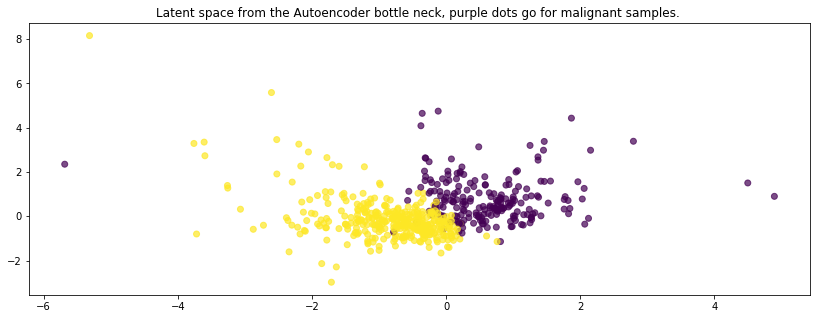

In [21]:
plt.figure(figsize=(14, 5))
net.eval()
data = torch.tensor(X, device=device)
enc = net.encoder(data.float()).detach().cpu().numpy()
plt.scatter(enc[:,0], enc[:,1], c=cancer_dset['target'], alpha=0.7);
plt.title('Latent space from the Autoencoder bottle neck, purple dots go for malignant samples. ');

### Task 2.2.  Autoencoder on kMNIST. (4 points)


We will build a latent representation for `kMRIST` dataset by using our AE. We will work with the data from `Part 1`.

1. **(2 pt.)** Train AE to get latent representation of the `kMNIST` dataset from `sklearn.datasets()`. Follow the instructions `2.0 - 2.4`. Use `MSE` loss and obtain < $0.035$ on validation, with AE "bottleneck"  $\leq 40$;
2. **(1 pt.)** Plot 10 images and their reconstructions. Plot the latent representation of the whole dataset in 3D, compare visually to your manifold from `Part 1` and upload (pictures) screenshots to this notebook.
3. **(1 pt.)** Get the classification accuracy for the latent features. Use the `KNN` classifier with any hyperparameters you like. Write a couple of sentences about the differences of `manifold learning` and ` AE` results. 
3. **(BONUS 3 pt.)** Sampling from latent representation.

In [22]:
def load(f):
    return np.load(f)['arr_0']

# Load the data
x_train = load('data/kmnist/kmnist-train-imgs.npz')
x_test = load('data/kmnist/kmnist-test-imgs.npz')
y_train = load('data/kmnist/kmnist-train-labels.npz')
y_test = load('data/kmnist/kmnist-test-labels.npz')

# Reshape the data and scale
x_train = x_train.reshape(-1, 784) / 255
x_test = x_test.reshape(-1, 784) / 255

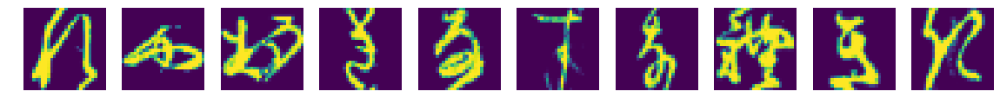

In [23]:
fig, ax = plt.subplots(ncols=10, figsize=(20, 5))
for i in range(10):
    ax[i].imshow(x_train[i].reshape(28,28));
    ax[i].axis('off')

In [24]:
class kMNISTData(torch_data.Dataset):
    def __init__(self, X, y):
        super(kMNISTData, self).__init__()
        self.X = torch.tensor(X, dtype=torch.float32)                                                    
        self.y = torch.tensor(y, dtype=torch.float32)
    
    def __len__(self):
        return self.X.size()[0]

    
    def __getitem__(self, idx):
        return self.X[idx].unsqueeze(0), self.y[idx]

In [25]:
train_kmnist = kMNISTData(x_train, y_train)
test_kmnist = kMNISTData(x_test, y_test)

#### 2.0 Create encoder and decoder network for kMNIST. 
You can either use convolutions or flatten the images and use linear layers. You can choose hidden size (not larger than 40) and any architecture you like.

In [26]:
dim = train_kmnist[0][0].size()[1]
large_dim = 200

encoder = lambda hidden_size: nn.Sequential(
    nn.Linear(dim, large_dim),
    nn.LeakyReLU(inplace=True),
    nn.Dropout(0.1),
    nn.Linear(large_dim, hidden_size),
)

decoder = lambda hidden_size: nn.Sequential(
    nn.Linear(hidden_size, large_dim),
    nn.LeakyReLU(inplace=True),
    nn.Dropout(0.1),
    nn.Linear(large_dim, dim)
)

#### 2.1 Train AE on the kMNIST. 
Your goal is to obtain MSE on the test set < $0.035$ on `MyFirstAE(encoder(40), decoder(40))`.

In [36]:
np.random.seed(42)

net = MyFirstAE(encoder(40), decoder(40)) 
criterion = nn.MSELoss()
optimizer = torch.optim.RMSprop(net.parameters(), lr=0.005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

train_loader = torch_data.DataLoader(train_kmnist, batch_size=500, shuffle=True)
val_loader = torch_data.DataLoader(test_kmnist, batch_size=1000, shuffle=False) 

In [37]:
epochs = 100
train(epochs, net, criterion, optimizer, train_loader, val_loader, scheduler)

Epoch 5/100 || Loss:  Train 0.1034 | Validation 0.0949
Epoch 10/100 || Loss:  Train 0.0888 | Validation 0.0836
Epoch 15/100 || Loss:  Train 0.0647 | Validation 0.0676
Epoch 20/100 || Loss:  Train 0.0530 | Validation 0.0518
Epoch 25/100 || Loss:  Train 0.0463 | Validation 0.0453
Epoch 30/100 || Loss:  Train 0.0441 | Validation 0.0442
Epoch 35/100 || Loss:  Train 0.0387 | Validation 0.0375
Epoch 40/100 || Loss:  Train 0.0405 | Validation 0.0374
Epoch 45/100 || Loss:  Train 0.0372 | Validation 0.0361
Epoch 50/100 || Loss:  Train 0.0355 | Validation 0.0349
Epoch 55/100 || Loss:  Train 0.0365 | Validation 0.0342
Epoch 60/100 || Loss:  Train 0.0347 | Validation 0.0341
Epoch 65/100 || Loss:  Train 0.0363 | Validation 0.0336
Epoch 70/100 || Loss:  Train 0.0357 | Validation 0.0334
Epoch 75/100 || Loss:  Train 0.0345 | Validation 0.0333
Epoch 80/100 || Loss:  Train 0.0348 | Validation 0.0331
Epoch 85/100 || Loss:  Train 0.0344 | Validation 0.0331
Epoch 90/100 || Loss:  Train 0.0349 | Validation 

#### 2.2 Plot any 10 images and their reconstructions.

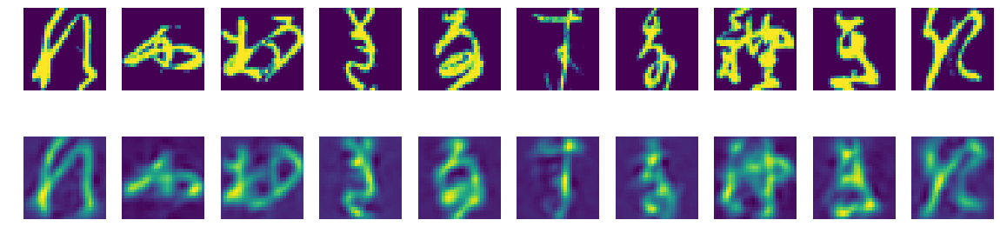

In [38]:
fig, ax = plt.subplots(ncols=10, nrows=2, figsize=(20, 5))
for i in range(10):
    im = train_kmnist[i][0]
    rec = im.to(device)
    ax[0, i].imshow(im[0].reshape(28, 28))
    ax[1, i].imshow(net(rec).detach().cpu().numpy().reshape(28, 28))
    ax[0, i].axis('off')
    ax[1, i].axis('off')

#### 2.3 Plot the latent representation of whole dataset in 3D, compare visually to your manifold from `Part 1` and upload (pictures) screenshoots to this notebook.

In [39]:
def plot_3d(X, y, title=''):
    
    digits_3d = pd.DataFrame({
        'x': X[:, 0], 
        'y': X[:, 1], 
        'z': X[:, 2],
        'label': y,
    })

    colors = cl.scales['10']['qual']['Paired']
    data = []

    for i in range(10):
        x = digits_3d[digits_3d['label'].astype('int') == i]['x']
        y = digits_3d[digits_3d['label'].astype('int') == i]['y']
        z = digits_3d[digits_3d['label'].astype('int') == i]['z']

        color = colors[i]

        trace = {
            'name': str(i),
            'x': x,
            'y': y,
            'z': z,
            'type': 'scatter3d',
            'mode': 'markers',
            'marker': {
                'size': 5,
                'color': color 
            }
        }
        data.append(trace)

    layout = go.Layout(
        title= title,
        width=900,
        height=600
    )

    fig = go.Figure(data=data, layout=layout)

    iplot(fig, show_link = False)

In [141]:
pca_mnist = pd.read_csv('mnist_three.csv', header=None)

In [142]:
pca_mnist = pca_mnist.values

In [143]:
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import colorlover as cl

init_notebook_mode(connected=True)

plot_3d(pca_mnist[:, :3] / 250, y_train, 'PCA MNIST')

![Manifold learning PCA](manifold.png)

In [57]:
data = torch.tensor(x_train, device=device)
enc = net.encoder(data.float()).detach().cpu().numpy()

test_data = torch.tensor(x_test, device=device)
test_enc = net.encoder(test_data.float()).detach().cpu().numpy()

In [54]:
plot_3d(enc[:, :3], y_train, 'AE MNIST')

![AE](ae.png)

#### 2.4 Get the classification accuracy for the latest features. Use the `KNN` classifier with any hyperparameters you'll choose. Write a couple of sentences comparing the results of `manifold learning` and ` AE`. 

In [56]:
from sklearn.neighbors import KNeighborsClassifier

cls = KNeighborsClassifier(n_jobs=-1)

In [59]:
cls.fit(enc[:, :50], y_train)
preds = cls.predict(test_enc[:, :50])
print(f'KNN accuracy score on AE features is {accuracy_score(y_test, preds)}')

KNN accuracy score on AE features is 0.904


For this number of dimentions, we used to get better results with knn + pca, rather than with this AE. However, the results could be different for the advantage of AE, is we did not put constraints on latent representation size.

Plots are comparable, but it seems that classes on the one from manifold learning are better distinguishible spatially. 

### BONUS: Sampling from latent space. (3 points)

Imagine, that you want to generate images, using you AE. To do that, you need to sample from the latent space and then decode the result. Of course, we do not know the exact distribution of the latent space. Therefore, let us assume that latent space distribution is Gaussian:

* Encode all the training images into the latent space
* Calculate mean and covariance matrix ($\mu$ and $\Sigma$)
* Sample  $z$ from the $\mathcal{N}(\mu, \Sigma)$
* Decode $z$ from the previous step to obtain an image

Using the procedure described above, sample 10 images and plot them (they should be similar to those of the initial dataset)

In [116]:
from sklearn.covariance import EmpiricalCovariance

In [131]:
small_batch = enc

In [132]:
mean = np.mean(small_batch)
cov = EmpiricalCovariance().fit(small_batch).covariance_

In [133]:
n_samples = len(small_batch)
latent = torch.randn(n_samples, 40) @ cov + mean

In [134]:
decoded_latent = net.decoder(latent.float().to(device))

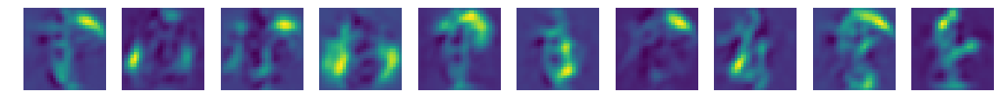

In [136]:
fig, ax = plt.subplots(ncols=10, nrows=1, figsize=(20, 5))
for i in range(10):
    im = decoded_latent[i]
    rec = im.to(device)
    ax[i].imshow(rec.detach().cpu().numpy().reshape(28, 28))
    ax[i].axis('off')

**Yeah, so you can get more than `100%` for the homework, good luck!**